In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import joblib
from joblib import load
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import validation_curve

from sklearn.ensemble import RandomForestRegressor

from itertools import product


from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, RepeatedKFold, RandomizedSearchCV
import multiprocessing

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, accuracy_score,roc_auc_score, roc_curve

from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
import lightgbm as lgb
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.model_selection import ParameterGrid
import sklearn.metrics as metrics

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.impute import SimpleImputer

from imblearn.combine import SMOTEENN
from imblearn.combine import SMOTETomek

import pickle  # Para cargar el modelo guardado

### (PARENTESIS)

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier


## 1. Carga de datos

In [3]:

data = pd.read_csv('df_con_grid.csv')


### Crear variables

In [4]:

# Definir la normalización de las variables


#Consideramos que el riesgo aumenta conforme la temperatura se aleja de un valor seguro, 
# por ejemplo, 30°C. A partir de los 40°C ya el riesgo se vuelve muy alto.
def Temperatura_normalizada(temperature):
    return max(0, min(1, (temperature - 30) / (40 - 30)))

#El riesgo de incendio crece cuando la humedad es muy baja. 
# Consideramos que la humedad es más peligrosa por debajo de un 30%.
def Humedad_normalizada(humidity):
    return max(0, min(1, (30 - humidity) / 30))

#La velocidad del viento también tiene un impacto importante. 
# Por ejemplo, un viento superior a 30 km/h puede hacer que un incendio se propague rápidamente.
def Viento_normalizado(wind_speed):
    return max(0, min(1, (wind_speed - 30) / (60 - 30)))

# Crear la nueva variable 'fire_risk_index' con la fórmula ponderada segun la importancia relativa que he considerado 
# donde he dado menos importancia al la velocidad del viendo que las otras dos variables T y H
def calculate_fire_risk(row):
    Temperature = Temperatura_normalizada(row['Temperature (C)']) 
    Humedad = Humedad_normalizada(row['Humidity (%)']) 
    Viento = Viento_normalizado(row['V_VIENTO']) 
    
    # Índice ponderado 30/30/30
    fire_risk_index = 0.4 * Temperature + 0.4 * Humedad + 0.2 * Viento
    
    return fire_risk_index

# Crear la nueva columna en el DataFrame
data['fire_risk_index'] = data.apply(calculate_fire_risk, axis=1)

# Guardar el DataFrame actualizado en un nuevo archivo CSV
output_file = 'df_con_grid_fire.csv'  #
data.to_csv(output_file, index=False)

print(f"Índice de riesgo de incendio calculado y guardado en '{output_file}'")


Índice de riesgo de incendio calculado y guardado en 'df_con_grid_fire.csv'


In [5]:
# Feature 1: 
data['difficulty_viento_humedad'] = data['DifficultyIndex'] * (data['V_VIENTO'] + data['Humidity (%)'])

# Feature 2:
data['fire_risk_fuel'] = data['fire_risk_index'] * (data['FuelLoadIndex'] / 100)

# Feature 3: 
data['fire_risk_landcover'] = data['fire_risk_index'] * data['LandCover']


output_file = 'df_con_grid_fire.csv'  #
data.to_csv(output_file, index=False)

print(f"Índice de riesgo de incendio calculado y guardado en '{output_file}'")

Índice de riesgo de incendio calculado y guardado en 'df_con_grid_fire.csv'


Creo a continuacion las variables de tipo clase para predecir si hay que madar o no aviones, buldozzer o helicopteros

In [6]:

data = pd.read_csv('df_con_grid_fire.csv')

In [7]:


def AvionAnfibio(range_str):
    if range_str == 0:
        return 0
    
    else:
        return 1


data['AVIANFNUM_CLASS'] = data['AVIANFNUM'].apply(AvionAnfibio)

In [8]:
def AvionTerre(range_str):
    if range_str == 0:
        return 0
    
    else:
        return 1


data['AVICARNUM_CLASS'] = data['AVICARNUM'].apply(AvionTerre)

In [9]:
def map_buldozzer(range_str):
    if range_str == 0:
        return 0
    
    else:
        return 1


data['BULDOZZER_CLASS'] = data['BULDOZZER'].apply(map_buldozzer)

data[['BULDOZZER_CLASS', 'BULDOZZER']].value_counts()

BULDOZZER_CLASS  BULDOZZER
0                0            10471
1                1               34
                 2               12
                 3                5
                 25               2
                 5                1
                 10               1
Name: count, dtype: int64

In [10]:
def map_AUTOBOMBA(range_str):
    if range_str == 0:
        return 0
    
    else:
        return 1


data['AUTOBOMBA_CLASS'] = data['AUTOBOMBA'].apply(map_AUTOBOMBA)

## 2. Filtrar datos

Se eliminan los datos que no pertenecen a la comunidad valenciana y que son dependientes de de la longuitud y la latitud.
Alguno de los datos que quedan pueden ser de otra comunidad dado que limitamos en cuadrado y la comunidad valenciana no es un rectangulo si no que tiene entradas y salidad del terreno

In [11]:
data = data.replace({',': ''}, regex=True)



Datos originales: (10526, 168)
Datos filtrados: (10526, 168)


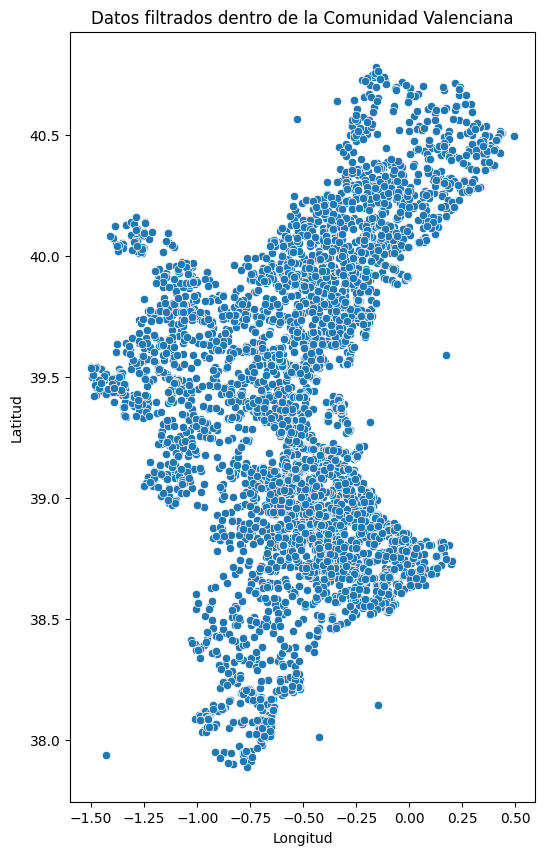

In [12]:
# Se incluyen unicamente los datos que estan dentro de las coordenadas correctas de la comunidad valenciana
data_filtrado = data[
    (data['Latitude'] <= 42) & (data['Latitude'] >= 36) &  # Latitude
    
    (data['Longitude'] <= 0.6) & (data['Longitude'] >= -1.7)  # Longitude
]

print(f"Datos originales: {data.shape}")
print(f"Datos filtrados: {data_filtrado.shape}")

# Gráfico
plt.figure(figsize=(6,10))
sns.scatterplot(data=data_filtrado, x='Longitude', y='Latitude')
plt.title("Datos filtrados dentro de la Comunidad Valenciana")
plt.xlabel("Longitud")
plt.ylabel("Latitud")
plt.show()


# AVIÓN CARGA 

In [572]:

X = data_filtrado[['COM_CODICV','COMARCA','CS_ELEC','DifficultyIndex','difficulty_viento_humedad','D_APIE','D_VIENTO','DTORMENTA','DULLUVIA',
             'EROSION','ESTACION','Elevation','fire_risk_index','fire_risk_landcover',
             'fire_risk_fuel', 'FuelLoadIndex','Humidity (%)','HOJA','IND_PEL','LandCover',
             'MOD_COM','PART_ASOC','Slope','Temperature (C)','V_VIENTO', 'X', 'Y']]
y = data_filtrado['AVICARNUM_CLASS']

In [559]:
model = RandomForestClassifier(random_state=42)
model.fit(X, y)

RandomForestClassifier(random_state=42)

Miro la importancia y entonces quito los ultimos que considera que tiene menos importancia para el modelo. Aunque vamos a hacer un Random forest y esto no afecta tanto como en uno lineal, quiro reducir la el tiempo de computo

In [560]:
importance = model.feature_importances_
importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': importance}).sort_values(by='Importance', ascending=False)
print(importance_df)




                      Feature  Importance
23            Temperature (C)    0.110676
16               Humidity (%)    0.082051
4   difficulty_viento_humedad    0.069468
22                      Slope    0.061117
26                          Y    0.060410
3             DifficultyIndex    0.057426
25                          X    0.055844
9                     EROSION    0.049211
11                  Elevation    0.044776
8                    DULLUVIA    0.044644
6                    D_VIENTO    0.044411
24                   V_VIENTO    0.039750
20                    MOD_COM    0.038536
0                  COM_CODICV    0.031034
1                     COMARCA    0.028929
5                      D_APIE    0.024327
18                    IND_PEL    0.023378
19                  LandCover    0.021413
13        fire_risk_landcover    0.020584
12            fire_risk_index    0.020302
15              FuelLoadIndex    0.019744
10                   ESTACION    0.018510
14             fire_risk_fuel    0

## 4.Modelos Clasificacion: AVIÓN ANFIBIO DESCARGA

Primero tenemos que saber si necesitamos `1` o no `0` aviones ANFIBIOS DE DESCARGA. He quitado algunas de las variables para que nos quite tiempo de procesado ya que al importancia  que le da es muy baja, y además por ejemplo `Hoja`hemos visto arriba que estaba correlacionada

In [530]:

X = data_filtrado[['COMARCA','DifficultyIndex','difficulty_viento_humedad','D_APIE','D_VIENTO','DULLUVIA',
             'EROSION','fire_risk_landcover','FuelLoadIndex','Humidity (%)','IND_PEL','LandCover',
             'MOD_COM','Slope','Temperature (C)','X', 'Y']] 
y = data_filtrado['AVICARNUM_CLASS']



X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

Comprobar si el modelo es balanceado o no

In [531]:
data_filtrado['AVICARNUM_CLASS'].value_counts().unique

<bound method Series.unique of AVICARNUM_CLASS
0    8168
1    2358
Name: count, dtype: int64>

Random Forest - AUC: 0.7309, Accuracy: 0.7853
XGBoost - AUC: 0.7206, Accuracy: 0.7758
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1650, number of negative: 5718
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2339
[LightGBM] [Info] Number of data points in the train set: 7368, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.223941 -> initscore=-1.242844
[LightGBM] [Info] Start training from score -1.242844


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [14:17:44] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


LightGBM - AUC: 0.7349, Accuracy: 0.7806
CatBoost - AUC: 0.7463, Accuracy: 0.7920


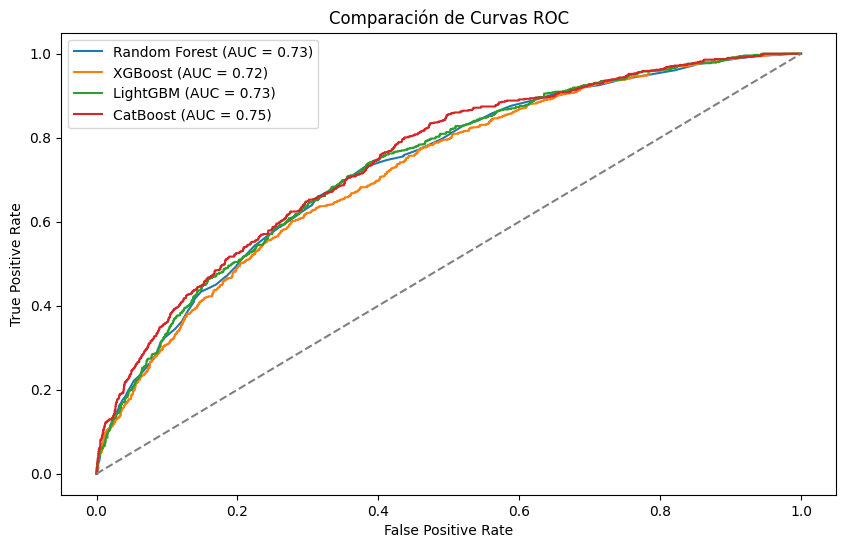

In [561]:



models = {
    "Random Forest": RandomForestClassifier(random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    "LightGBM": LGBMClassifier(random_state=42),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=42)
}

# Entrenamiento y evaluación
results = {}
for name, model in models.items():
    # Entrenar el modelo
    model.fit(X_train, y_train)
    
    # Predicciones en el conjunto de prueba
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Evaluación
    auc = roc_auc_score(y_test, y_pred_proba)
    accuracy = accuracy_score(y_test, y_pred)
    results[name] = {"AUC": auc, "Accuracy": accuracy}
    
    # Imprimir métricas
    print(f"{name} - AUC: {auc:.4f}, Accuracy: {accuracy:.4f}")

# Comparar las curvas ROC
plt.figure(figsize=(10, 6))
for name, model in models.items():
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    plt.plot(fpr, tpr, label=f"{name} (AUC = {results[name]['AUC']:.2f})")

# Línea base
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Comparación de Curvas ROC')
plt.legend()
plt.show()



### 4.1. Random forest Classifier 

In [533]:
forest = RandomForestClassifier (random_state=42, class_weight='balanced')

In [534]:
forest.fit(X_train,y_train)

RandomForestClassifier(class_weight='balanced', random_state=42)

In [535]:
print("Precisión sobre datos de pruebas: {:.4f}"
      .format(forest.score(X_test, y_test)))
print("Precisión sobre datos de train: {:.4f}"
      .format(forest.score(X_train, y_train)))

Precisión sobre datos de pruebas: 0.7856
Precisión sobre datos de train: 0.9993


In [537]:
predicciones = forest.predict(X = X_test)

mat_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = predicciones
                )

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = predicciones,
            normalize = True
           )

print("Matriz de confusión")
print(mat_confusion)
print("")
print(f"El accuracy de test es: {100 * accuracy} %")

print(
    classification_report(
        y_true = y_test,
        y_pred = predicciones
    )
)


Matriz de confusión
[[2351   99]
 [ 578  130]]

El accuracy de test es: 78.56238125395821 %
              precision    recall  f1-score   support

           0       0.80      0.96      0.87      2450
           1       0.57      0.18      0.28       708

    accuracy                           0.79      3158
   macro avg       0.69      0.57      0.58      3158
weighted avg       0.75      0.79      0.74      3158



In [538]:
param_range = [30,40,50,60,90,100,130,150,200,300,500]
train_score, test_score= validation_curve(
                                forest,
                                X = X_train, y = y_train, 
                                param_name = 'n_estimators', 
                               param_range=param_range,
                                scoring="accuracy")

In [539]:
print("Numero de estimadores para un Cross_val 5 (test) y para todo dataset de entrenamiento (train)")
print ('n_estimators 30 en test:',test_score[0].mean(),'en train:',train_score[0].mean())
print ('n_estimators 40 en test:',test_score[1].mean(),'en train:',train_score[1].mean())
print ('n_estimators 50 en test:',test_score[2].mean(),'en train:',train_score[2].mean())
print ('n_estimators 60 en test:',test_score[3].mean(),'en train:',train_score[3].mean())
print ('n_estimators 90 en test:',test_score[4].mean(),'en train:',train_score[4].mean())
print ('n_estimators 100 en test:',test_score[5].mean(),'en train:',train_score[5].mean())
print ('n_estimators 130 en test:',test_score[6].mean(),'en train:',train_score[6].mean())
print ('n_estimators 150 en test:',test_score[7].mean(),'en train:',train_score[7].mean())
print ('n_estimators 200 en test:',test_score[8].mean(),'en train:',train_score[8].mean())
print ('n_estimators 300 en test:',test_score[9].mean(),'en train:',train_score[9].mean())
print ('n_estimators 500 en test:',test_score[10].mean(),'en train:',train_score[10].mean())

Numero de estimadores para un Cross_val 5 (test) y para todo dataset de entrenamiento (train)
n_estimators 30 en test: 0.7863739071721563 en train: 0.9965730218882474
n_estimators 40 en test: 0.7865091318080952 en train: 0.9982356261150844
n_estimators 50 en test: 0.7888166094172722 en train: 0.9988124551555858
n_estimators 60 en test: 0.7881380912508371 en train: 0.9988124551555858
n_estimators 90 en test: 0.7897666822340804 en train: 0.9994910423417613
n_estimators 100 en test: 0.7911238106818251 en train: 0.9994910423417613
n_estimators 130 en test: 0.7913951811024493 en train: 0.999558896455417
n_estimators 150 en test: 0.7913948126429508 en train: 0.999558896455417
n_estimators 200 en test: 0.7931595494108794 en train: 0.999558896455417
n_estimators 300 en test: 0.7922092923643217 en train: 0.999558896455417
n_estimators 500 en test: 0.7923454381490067 en train: 0.999558896455417


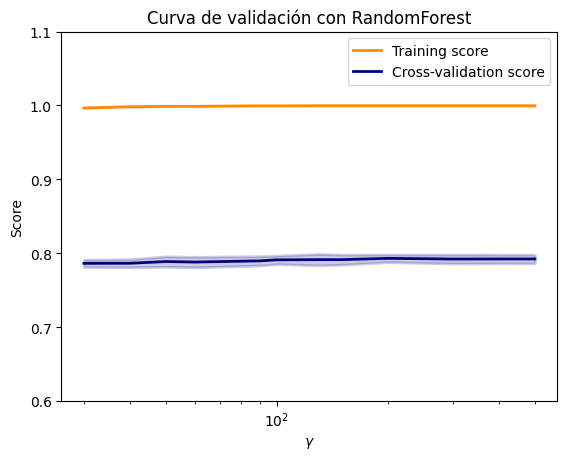

In [540]:
train_scores_mean = np.mean(train_score, axis=1)
train_scores_std = np.std(train_score, axis=1)
test_scores_mean = np.mean(test_score, axis=1)
test_scores_std = np.std(test_score, axis=1)

plt.title("Curva de validación con RandomForest")
plt.xlabel(r"$\gamma$")
plt.ylabel("Score")
plt.ylim(0.6, 1.1)
lw = 2
plt.semilogx(param_range, train_scores_mean, label="Training score",
             color="darkorange", lw=lw)
plt.fill_between(param_range, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="darkorange", lw=lw)
plt.semilogx(param_range, test_scores_mean, label="Cross-validation score",
             color="navy", lw=lw)
plt.fill_between(param_range, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2,
                 color="navy", lw=lw)
plt.legend(loc="best")
plt.show()

In [541]:
# Arboles
n_estimators = [int(x) for x in np.linspace(start = 50, stop = 800, num = 50)]

# Características de los arboles en número
max_features = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,  'sqrt', 'log2']
max_features.append('auto')

# Profundidad de arbol
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

# Minimo valor para separar en subnodos
min_samples_split = [2, 5, 8, 10]

# Minimo numero de muestras necesarias en hoja despues de dividir
min_samples_leaf = [1, 2 ,3, 4, 5]

# Numero maximo de nodos finales
max_leaf_nodes = [int(x) for x in np.linspace(10, 100, num = 90)]
max_leaf_nodes.append(None)


param_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               "max_leaf_nodes": max_leaf_nodes}


In [542]:
forest_random = RandomizedSearchCV(estimator = forest, 
                                   param_distributions = param_grid, 
                                   n_iter = 30, 
                                   cv = 5, 
                                   scoring='roc_auc',
                                   verbose=1, 
                                   random_state=42, 
                                   n_jobs = 1)


In [543]:
forest_random.fit(X_train,y_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
10 fits failed out of a total of 150.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/

RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(class_weight='balanced',
                                                    random_state=42),
                   n_iter=30, n_jobs=1,
                   param_distributions={'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': [1, 2, 3, 4, 5, 6, 7, 8,
                                                         9, 10, 11, 12, 13, 14,
                                                         'sqrt', 'log2',
                                                         'auto'],
                                        'max_leaf_nodes': [10, 11, 12, 13, 14,
                                                           15, 16, 17, 18, 19,
                                                           20, 21, 22, 23, 24,
                                                           25, 26, 27, 28, 29,
                                                           30, 31, 32, 33, 34,
                                                           35, 36, 37, 38, 39, ...],
                                        'min_samples_leaf': [1, 2, 3, 4, 5],
                                        'min_samples_split': [2, 5, 8, 10],
                                        'n_estimators': [50, 65, 80, 95, 111,
                                                         126, 141, 157, 172,
                                                         187, 203, 218, 233,
                                                         248, 264, 279, 294,
                                                         310, 325, 340, 356,
                                                         371, 386, 402, 417,
                                                         432, 447, 463, 478,
                                                         493, ...]},
                   random_state=42, scoring='roc_auc', verbose=1)

In [544]:
best_forest = forest_random.best_estimator_

<BarContainer object of 17 artists>

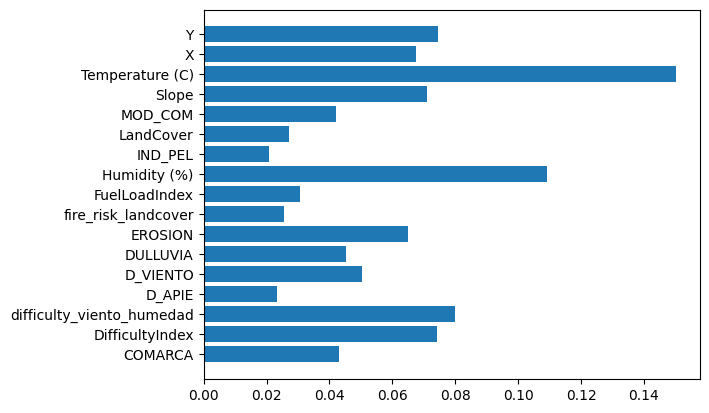

In [545]:
plt.barh(X.columns, best_forest.feature_importances_)

In [546]:
best_forest.fit(X_train,y_train)

RandomForestClassifier(class_weight='balanced', max_depth=90, max_features=3,
                       min_samples_leaf=4, n_estimators=616, random_state=42)

In [547]:
print('BALANCED_ BEST_PARAMS_')

print("Precisión sobre datos de pruebas: {:.4f}"
      .format(best_forest.score(X_test, y_test)))
print("Precisión sobre datos de train: {:.4f}"
      .format(best_forest.score(X_train, y_train)))

BALANCED_ BEST_PARAMS_
Precisión sobre datos de pruebas: 0.7793
Precisión sobre datos de train: 0.9682


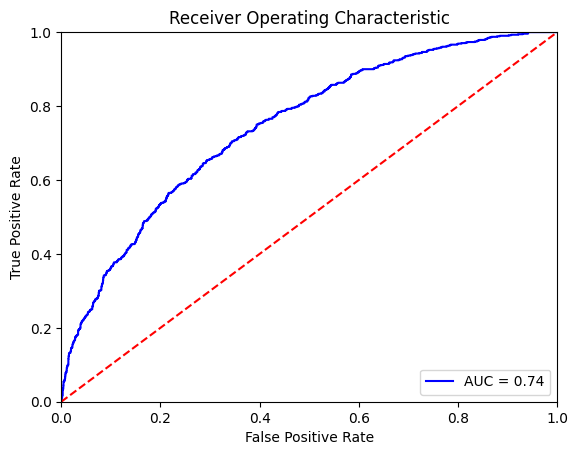

In [548]:
probs = best_forest.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [549]:
predicciones = best_forest.predict(X = X_test)

mat_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = predicciones
                )

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = predicciones,
            normalize = True
           )

print("Matriz de confusión")
print(mat_confusion)
print("")
print(f"El accuracy de test es: {100 * accuracy} %")

print(
    classification_report(
        y_true = y_test,
        y_pred = predicciones
    )
)


Matriz de confusión
[[2204  246]
 [ 451  257]]

El accuracy de test es: 77.9290690310323 %
              precision    recall  f1-score   support

           0       0.83      0.90      0.86      2450
           1       0.51      0.36      0.42       708

    accuracy                           0.78      3158
   macro avg       0.67      0.63      0.64      3158
weighted avg       0.76      0.78      0.77      3158



In [550]:
#Rango umbrales en pasos pequeños
thresholds = np.arange(0.1, 1.0, 0.1)
precisions = []
recalls = []
f1_scores = []

# Metricas por umbral
for threshold in thresholds:
    y_pred_adjusted = (preds >= threshold).astype(int)  # Aplicar el umbral
    precisions.append(precision_score(y_test, y_pred_adjusted))
    recalls.append(recall_score(y_test, y_pred_adjusted))
    f1_scores.append(f1_score(y_test, y_pred_adjusted))

# resultados
for i, threshold in enumerate(thresholds):
    print(f"Umbral: {threshold:.1f}, Precision: {precisions[i]:.4f}, Recall: {recalls[i]:.4f}, F1-score: {f1_scores[i]:.4f}")


Umbral: 0.1, Precision: 0.2460, Recall: 0.9873, F1-score: 0.3939
Umbral: 0.2, Precision: 0.2925, Recall: 0.8997, F1-score: 0.4414
Umbral: 0.3, Precision: 0.3513, Recall: 0.7542, F1-score: 0.4794
Umbral: 0.4, Precision: 0.4278, Recall: 0.5650, F1-score: 0.4869
Umbral: 0.5, Precision: 0.5109, Recall: 0.3630, F1-score: 0.4244
Umbral: 0.6, Precision: 0.6107, Recall: 0.2105, F1-score: 0.3130
Umbral: 0.7, Precision: 0.6947, Recall: 0.0932, F1-score: 0.1644
Umbral: 0.8, Precision: 0.6818, Recall: 0.0212, F1-score: 0.0411
Umbral: 0.9, Precision: 0.0000, Recall: 0.0000, F1-score: 0.0000


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


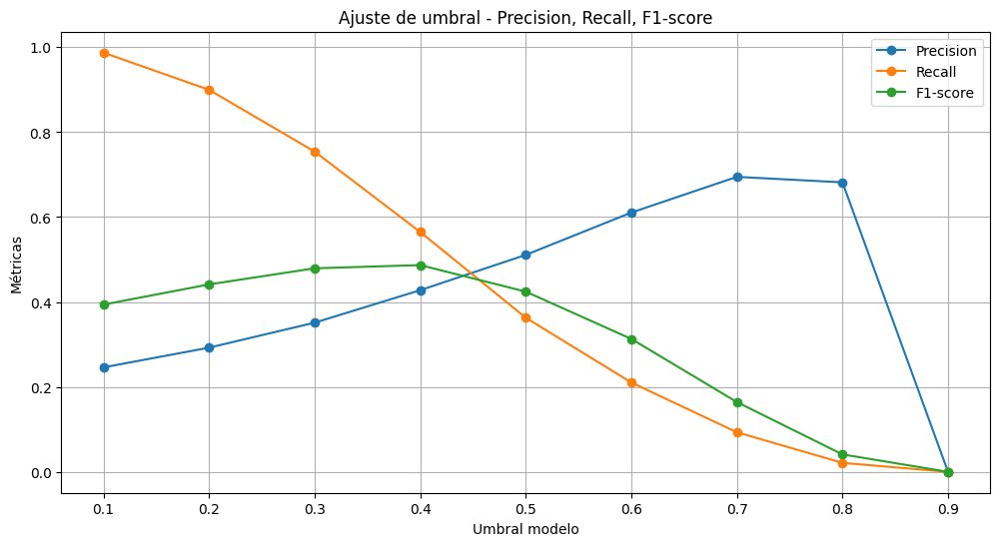

In [551]:
plt.figure(figsize=(12, 6))
plt.plot(thresholds, precisions, label='Precision', marker='o')
plt.plot(thresholds, recalls, label='Recall', marker='o')
plt.plot(thresholds, f1_scores, label='F1-score', marker='o')
plt.xlabel('Umbral modelo')
plt.ylabel('Métricas')
plt.title('Ajuste de umbral - Precision, Recall, F1-score')
plt.legend()
plt.grid(True)
plt.show()


In [552]:
# Coste de un falso positivo (enviar un avión innecesariamente)
cost_fp = 855.55*3  # Coste de enviar un avión segun los datos que tenemos en la introducción de coste hora.
# pongo un *2 porque en la comunidad valenciana tienen 3 y suponemos que mandamos todas las unidades

# Estimación del coste de un falso negativo (no enviar un avión cuando es necesario)
cost_fn = (6343*0.07) # Un valor extraido de las hectarias mediana (medias muy altas) quemadas en los datos obtenidos 
#y el coste medio de perdida medio ambiental segúnhttps://evenor-tech.com/el-coste-economico-de-los-incendios-forestales/

thresholds = np.arange(0.1, 1.0, 0.1)
total_costs = []

for threshold in thresholds:
    # Aplicar el umbral para hacer las predicciones ajustadas
    y_pred_adjusted = (preds >= threshold).astype(int)
    
    # Calculoo FP y FN
    false_positive = ((y_pred_adjusted == 1) & (y_test == 0)).sum()
    false_negative = ((y_pred_adjusted == 0) & (y_test == 1)).sum()

    # Coste total
    total_cost = (false_positive * cost_fp) + (false_negative * cost_fn)
    total_costs.append(total_cost)


for i, threshold in enumerate(thresholds):
    print(f"Umbral: {threshold:.1f}, Coste total: {total_costs[i]:.2f} €")


Umbral: 0.1, Coste total: 5501760.39 €
Umbral: 0.2, Coste total: 3986732.36 €
Umbral: 0.3, Coste total: 2607974.64 €
Umbral: 0.4, Coste total: 1509912.83 €
Umbral: 0.5, Coste total: 831644.41 €
Umbral: 0.6, Coste total: 492033.34 €
Umbral: 0.7, Coste total: 359487.27 €
Umbral: 0.8, Coste total: 325665.48 €
Umbral: 0.9, Coste total: 314359.08 €


Teniendo en cuenta las catastofre natura en la comunidad Valencia en la actualidad (Dana, 2024), se decide tener un sesgo hacia la preservación de la naturaleza frente al coste económico que puede suponer un falso positivo, ya que la situación socal puede ser determinante en costes posteriores (costes socio-economicos-politicos)

Por eso se decide un `Umbral de 0,38` Para mejorar el Recall de los positivos `1`

In [553]:
# Ajuste umbral
threshold = 0.38
y_pred_adjusted = (preds  >= threshold).astype(int)

In [554]:
print(confusion_matrix(y_test, y_pred_adjusted))

print(classification_report(y_test, y_pred_adjusted))



[[1826  624]
 [ 283  425]]
              precision    recall  f1-score   support

           0       0.87      0.75      0.80      2450
           1       0.41      0.60      0.48       708

    accuracy                           0.71      3158
   macro avg       0.64      0.67      0.64      3158
weighted avg       0.76      0.71      0.73      3158



In [555]:
filename = '../Modelos/Avion_terrestre/best_forest_ATerrestre.pkl'

In [556]:
model_and_threshold = {
    'model': best_forest,
    'threshold': threshold}

    
joblib.dump(model_and_threshold, filename)

['../Modelos/Avion_terrestre/best_forest_ATerrestre.pkl']

### 4.2 Gradient Boosting

In [576]:



X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [577]:
lgb_clf =lgb.LGBMClassifier(random_state=42, class_weight='balanced')

In [578]:
lgb_clf.fit(X_train,y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1650, number of negative: 5718
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3290
[LightGBM] [Info] Number of data points in the train set: 7368, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


LGBMClassifier(class_weight='balanced', random_state=42)

In [579]:

importance = lgb_clf.feature_importances_
importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': importance}).sort_values(by='Importance', ascending=False)
print(importance_df)


                      Feature  Importance
16               Humidity (%)         301
23            Temperature (C)         287
4   difficulty_viento_humedad         214
11                  Elevation         209
22                      Slope         205
25                          X         198
26                          Y         167
3             DifficultyIndex         156
20                    MOD_COM         138
6                    D_VIENTO         137
8                    DULLUVIA         130
24                   V_VIENTO         106
5                      D_APIE          85
0                  COM_CODICV          84
1                     COMARCA          74
13        fire_risk_landcover          67
19                  LandCover          66
15              FuelLoadIndex          63
14             fire_risk_fuel          61
10                   ESTACION          60
9                     EROSION          60
12            fire_risk_index          59
18                    IND_PEL     

In [580]:

X = data_filtrado[['COMARCA','DifficultyIndex','difficulty_viento_humedad','D_APIE','D_VIENTO','DULLUVIA',
             'EROSION','fire_risk_landcover','FuelLoadIndex','Humidity (%)','IND_PEL','LandCover',
             'MOD_COM','Slope','Temperature (C)','X', 'Y']] 
y = data_filtrado['AVICARNUM_CLASS']



X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

Tengo error que no me permite el poder hacer le modelo por lo tanto lo que hago es intentar anular ese error haciendo que los objetos se conviertan en int o float

In [581]:

object_columns = X_train.select_dtypes(include=['object']).columns
print("Columnas con dtype object:", object_columns)

# Convertir a numérico (si los valores son realmente números)
for col in object_columns:
    X_train[col] = pd.to_numeric(X_train[col], errors='coerce')
    X_test[col] = pd.to_numeric(X_test[col], errors='coerce')

print(X_train.dtypes)

Columnas con dtype object: Index([], dtype='object')
COMARCA                        int64
DifficultyIndex              float64
difficulty_viento_humedad    float64
D_APIE                         int64
D_VIENTO                       int64
DULLUVIA                       int64
EROSION                        int64
fire_risk_landcover          float64
FuelLoadIndex                float64
Humidity (%)                 float64
IND_PEL                        int64
LandCover                    float64
MOD_COM                        int64
Slope                        float64
Temperature (C)              float64
X                            float64
Y                            float64
dtype: object


In [582]:
X_train['COMARCA'].mean()


2610.910016286645

In [583]:
lgb_clf.fit(X_train,y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1650, number of negative: 5718
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000568 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2339
[LightGBM] [Info] Number of data points in the train set: 7368, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


LGBMClassifier(class_weight='balanced', random_state=42)

In [585]:
print("Precisión sobre el juego de pruebas: {:.4f}"
      .format(lgb_clf.score(X_test, y_test)))
print("Precisión sobre el juego de train: {:.4f}"
      .format(lgb_clf.score(X_train, y_train)))

Precisión sobre el juego de pruebas: 0.7185
Precisión sobre el juego de train: 0.8846


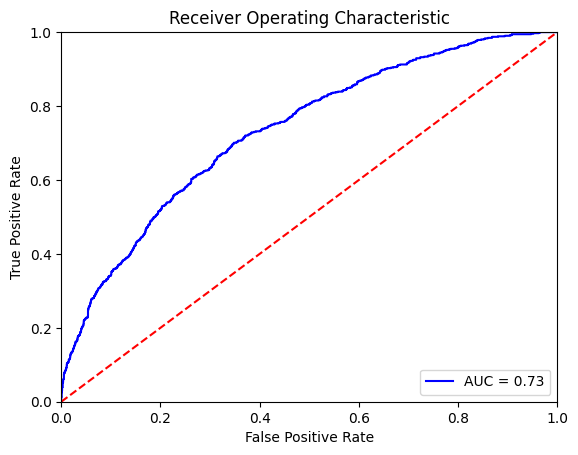

In [587]:
probs = lgb_clf.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [589]:
predicciones = lgb_clf.predict(X = X_test)

mat_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = predicciones
                )

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = predicciones,
            normalize = True
           )

print("Matriz de confusión")
print(mat_confusion)
print("")
print(f"El accuracy de test es: {100 * accuracy} %")

print(
    classification_report(
        y_true = y_test,
        y_pred = predicciones
    )
)


Matriz de confusión
[[1867  583]
 [ 306  402]]

El accuracy de test es: 71.84927169094364 %
              precision    recall  f1-score   support

           0       0.86      0.76      0.81      2450
           1       0.41      0.57      0.47       708

    accuracy                           0.72      3158
   macro avg       0.63      0.66      0.64      3158
weighted avg       0.76      0.72      0.73      3158



In [590]:
param_range = [20,60,90,100,150,200,250,300,400,500]
train_score, test_score= validation_curve(
                                lgb_clf,
                                X = X_train, y = y_train, 
                                param_name = 'n_estimators', 
                               param_range=param_range,
                                scoring="accuracy")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1320, number of negative: 4574
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000731 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2323
[LightGBM] [Info] Number of data points in the train set: 5894, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1320, number of negative: 4574
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wi

In [591]:
print("Numero de estimadores para un Cross_val 5 (test) y para todo dataset de entrenamiento (train)")
print ('n_estimators 10 en test:',test_score[0].mean(),'en train :',train_score[0].mean())
print ('n_estimators 60 en test:',test_score[1].mean(),'en train:',train_score[1].mean())
print ('n_estimators 90 en test:',test_score[2].mean(),'en train:',train_score[2].mean())
print ('n_estimators 100 en test:',test_score[3].mean(),'en train:',train_score[3].mean())
print ('n_estimators 150 en test:',test_score[4].mean(),'en train:',train_score[4].mean())
print ('n_estimators 200 en test:',test_score[5].mean(),'en train:',train_score[5].mean())
print ('n_estimators 250 en test:',test_score[6].mean(),'en train:',train_score[6].mean())
print ('n_estimators 300 en test:',test_score[7].mean(),'en train:',train_score[7].mean())
print ('n_estimators 400 en test:',test_score[8].mean(),'en train:',train_score[8].mean())
print ('n_estimators 500 en test:',test_score[9].mean(),'en train:',train_score[9].mean())

Numero de estimadores para un Cross_val 5 (test) y para todo dataset de entrenamiento (train)
n_estimators 10 en test: 0.6959816728245461 en train : 0.7638096504459762
n_estimators 60 en test: 0.7248902681556114 en train: 0.850094836312312
n_estimators 90 en test: 0.732354336445895 en train: 0.8909134603899883
n_estimators 100 en test: 0.7328967088276447 en train: 0.9017712467905575
n_estimators 150 en test: 0.7456546189622154 en train: 0.9420128230920419
n_estimators 200 en test: 0.7539350092713621 en train: 0.9656962745570385
n_estimators 250 en test: 0.7565136730714139 en train: 0.9812703535718532
n_estimators 300 en test: 0.7607208357398344 en train: 0.9898548256978748
n_estimators 400 en test: 0.7646579175958754 en train: 0.997081991058891
n_estimators 500 en test: 0.7675076754719276 en train: 0.9988124263745739


In [592]:
boosting_type = ['gbdt','dart']
#Numero de Hojas máximas por árboles
num_leaves = [int(x) for x in np.linspace(30, 110, num = 9)]

# Profundidad de arbol
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

#Learning rate
learning_rate = [round (float(x), 2) for x in np.linspace(0.1, 1., num = 10)]
learning_rate.append(0.005)
learning_rate = sorted(learning_rate)

# Numero de arboles del bosque
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 800, num = 50)]

# Número de muestras para la construcción de contenedores
subsample_for_bin =  list(range(20000, 300000, 20000))

# Reducción mínima de pérdidas para realizar una nueva partición en un nodo del árbol.
min_split_gain =  [0.0,0.2,0.4,0.6,0.8]

#Número mínimo de datos necesarios en una hoja
min_child_samples = [int(x) for x in np.linspace(1, 40, num = 10)]

# reg_alpha
reg_alpha = [round (float(x), 2) for x in np.linspace(0.0, 1., num = 11)]
# reg_lambda
reg_lambda = [round (float(x), 2)  for x in np.linspace(0.0, 1., num = 11)]
# Creacion de cuadrícula aleatoria
param_grid = {'boosting_type':boosting_type,
              'num_leaves': num_leaves,
              'max_depth': max_depth,
              'learning_rate': learning_rate,
              'n_estimators': n_estimators,
              'subsample_for_bin': subsample_for_bin,
              'min_split_gain': min_split_gain,
              'min_child_samples':min_child_samples,
              'reg_alpha':reg_alpha,
              'reg_lambda':reg_lambda}
print(param_grid)

{'boosting_type': ['gbdt', 'dart'], 'num_leaves': [30, 40, 50, 60, 70, 80, 90, 100, 110], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'learning_rate': [0.005, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0], 'n_estimators': [100, 114, 128, 142, 157, 171, 185, 200, 214, 228, 242, 257, 271, 285, 300, 314, 328, 342, 357, 371, 385, 400, 414, 428, 442, 457, 471, 485, 500, 514, 528, 542, 557, 571, 585, 600, 614, 628, 642, 657, 671, 685, 700, 714, 728, 742, 757, 771, 785, 800], 'subsample_for_bin': [20000, 40000, 60000, 80000, 100000, 120000, 140000, 160000, 180000, 200000, 220000, 240000, 260000, 280000], 'min_split_gain': [0.0, 0.2, 0.4, 0.6, 0.8], 'min_child_samples': [1, 5, 9, 14, 18, 22, 27, 31, 35, 40], 'reg_alpha': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0], 'reg_lambda': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]}


In [593]:
light_gbm_random = RandomizedSearchCV(estimator = lgb_clf, 
                                   param_distributions = param_grid, 
                                   n_iter = 50, 
                                   cv = 5, 
                                   scoring='roc_auc',
                                   verbose=1, 
                                   random_state=42, 
                                   n_jobs = 1)

In [594]:
light_gbm_random.fit(X_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1320, number of negative: 4574
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2323
[LightGBM] [Info] Number of data points in the train set: 5894, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

RandomizedSearchCV(cv=5,
                   estimator=LGBMClassifier(class_weight='balanced',
                                            random_state=42),
                   n_iter=50, n_jobs=1,
                   param_distributions={'boosting_type': ['gbdt', 'dart'],
                                        'learning_rate': [0.005, 0.1, 0.2, 0.3,
                                                          0.4, 0.5, 0.6, 0.7,
                                                          0.8, 0.9, 1.0],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'min_child_samples': [1, 5, 9, 14, 18,
                                                              22, 27, 31, 35,
                                                              40],
                                        'min_split_gain': [0.0...
                                                         442, 457, 471, 485,
                                                         500, 514, ...],
                                        'num_leaves': [30, 40, 50, 60, 70, 80,
                                                       90, 100, 110],
                                        'reg_alpha': [0.0, 0.1, 0.2, 0.3, 0.4,
                                                      0.5, 0.6, 0.7, 0.8, 0.9,
                                                      1.0],
                                        'reg_lambda': [0.0, 0.1, 0.2, 0.3, 0.4,
                                                       0.5, 0.6, 0.7, 0.8, 0.9,
                                                       1.0],
                                        'subsample_for_bin': [20000, 40000,
                                                              60000, 80000,
                                                              100000, 120000,
                                                              140000, 160000,
                                                              180000, 200000,
                                                              220000, 240000,
                                                              260000, 280000]},
                   random_state=42, scoring='roc_auc', verbose=1)

In [595]:
best_light_gbm = light_gbm_random.best_estimator_

<BarContainer object of 17 artists>

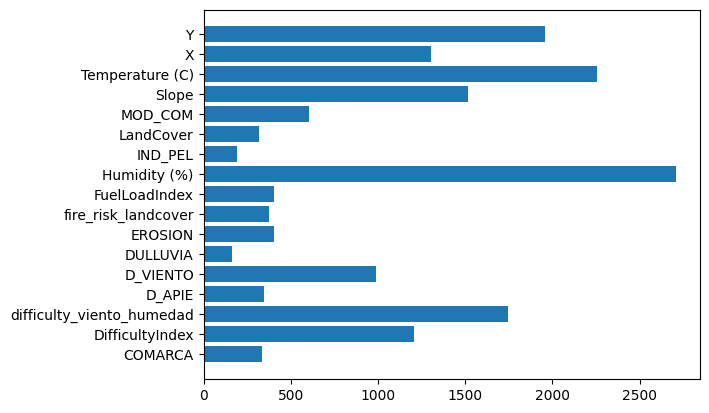

In [596]:
plt.barh(X.columns, best_light_gbm.feature_importances_)

In [597]:
best_light_gbm.fit(X_train,y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1650, number of negative: 5718
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000655 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2339
[LightGBM] [Info] Number of data points in the train set: 7368, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

LGBMClassifier(boosting_type='dart', class_weight='balanced', learning_rate=0.2,
               max_depth=50, min_child_samples=22, min_split_gain=0.8,
               n_estimators=557, num_leaves=40, random_state=42, reg_alpha=1.0,
               reg_lambda=0.5)

In [598]:
print('BALANCED_ BEST_PARAMS_')

print("Precisión sobre el juego de test: {:.4f}"
      .format(best_light_gbm.score(X_test, y_test)))
print("Precisión sobre el juego de train: {:.4f}"
      .format(best_light_gbm.score(X_train, y_train)))

BALANCED_ BEST_PARAMS_
Precisión sobre el juego de test: 0.7210
Precisión sobre el juego de train: 0.8947


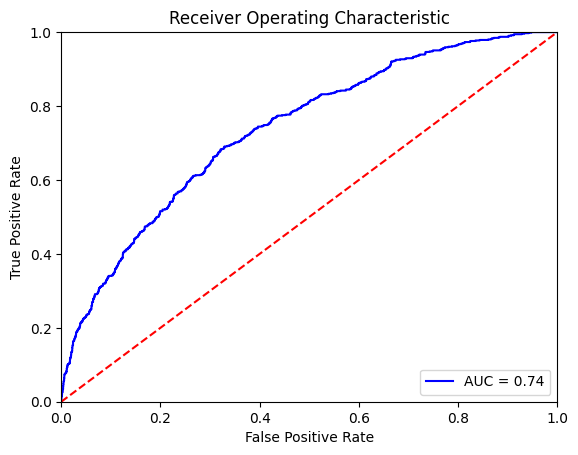

In [599]:
probs = best_light_gbm.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [600]:
predicciones = best_light_gbm.predict(X = X_test)
mat_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = predicciones
                )

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = predicciones,
            normalize = True
           )

print("Matriz de confusión")
print(mat_confusion)
print("")
print(f"El accuracy de test es: {100 * accuracy} %")

print(
    classification_report(
        y_true = y_test,
        y_pred = predicciones
    )
)


Matriz de confusión
[[1878  572]
 [ 309  399]]

El accuracy de test es: 72.102596580114 %
              precision    recall  f1-score   support

           0       0.86      0.77      0.81      2450
           1       0.41      0.56      0.48       708

    accuracy                           0.72      3158
   macro avg       0.63      0.67      0.64      3158
weighted avg       0.76      0.72      0.73      3158



In [601]:
#Rango umbrales en pasos pequeños
thresholds = np.arange(0.1, 1.0, 0.1)
precisions = []
recalls = []
f1_scores = []

# Metricas por umbral
for threshold in thresholds:
    y_pred_adjusted = (preds >= threshold).astype(int)  # Aplicar el umbral
    precisions.append(precision_score(y_test, y_pred_adjusted))
    recalls.append(recall_score(y_test, y_pred_adjusted))
    f1_scores.append(f1_score(y_test, y_pred_adjusted))

# resultados
for i, threshold in enumerate(thresholds):
    print(f"Umbral: {threshold:.1f}, Precision: {precisions[i]:.4f}, Recall: {recalls[i]:.4f}, F1-score: {f1_scores[i]:.4f}")


Umbral: 0.1, Precision: 0.2522, Recall: 0.9774, F1-score: 0.4009
Umbral: 0.2, Precision: 0.2839, Recall: 0.9025, F1-score: 0.4319
Umbral: 0.3, Precision: 0.3192, Recall: 0.8065, F1-score: 0.4573
Umbral: 0.4, Precision: 0.3666, Recall: 0.7006, F1-score: 0.4813
Umbral: 0.5, Precision: 0.4109, Recall: 0.5636, F1-score: 0.4753
Umbral: 0.6, Precision: 0.4770, Recall: 0.4096, F1-score: 0.4407
Umbral: 0.7, Precision: 0.5489, Recall: 0.2698, F1-score: 0.3617
Umbral: 0.8, Precision: 0.6527, Recall: 0.1540, F1-score: 0.2491
Umbral: 0.9, Precision: 0.7800, Recall: 0.0551, F1-score: 0.1029


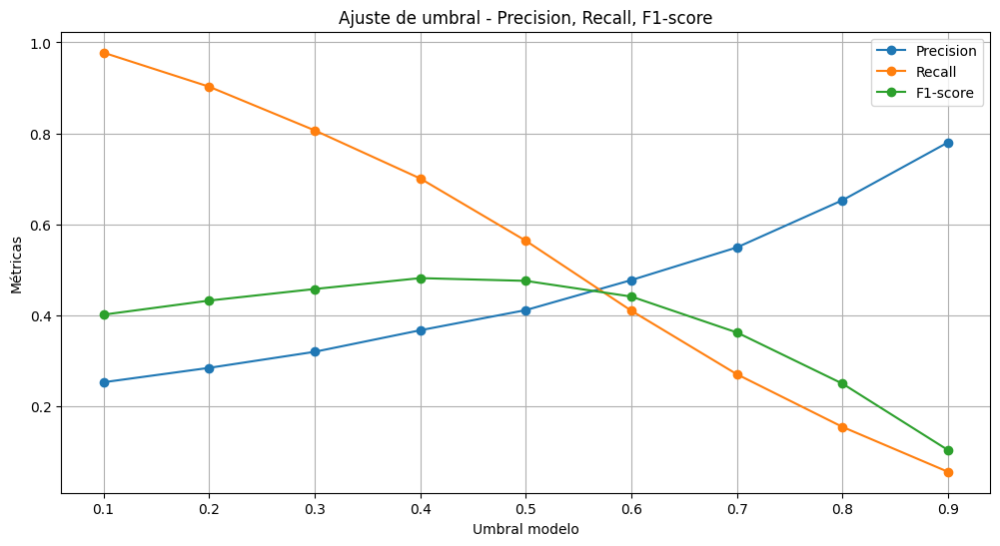

In [604]:
plt.figure(figsize=(12, 6))
plt.plot(thresholds, precisions, label='Precision', marker='o')
plt.plot(thresholds, recalls, label='Recall', marker='o')
plt.plot(thresholds, f1_scores, label='F1-score', marker='o')
plt.xlabel('Umbral modelo')
plt.ylabel('Métricas')
plt.title('Ajuste de umbral - Precision, Recall, F1-score')
plt.legend()
plt.grid(True)
plt.show()


In [605]:
# Coste de un falso positivo (enviar un avión innecesariamente)
cost_fp = 855.55*3  # Coste de enviar un avión segun los datos que tenemos en la introducción de coste hora.
# pongo un *2 porque en la comunidad valenciana tienen 3 y suponemos que mandamos todas las unidades

# Estimación del coste de un falso negativo (no enviar un avión cuando es necesario)
cost_fn = (6343*0.07) # Un valor extraido de las hectarias mediana (medias muy altas) quemadas en los datos obtenidos 
#y el coste medio de perdida medio ambiental segúnhttps://evenor-tech.com/el-coste-economico-de-los-incendios-forestales/

thresholds = np.arange(0.1, 1.0, 0.1)
total_costs = []

for threshold in thresholds:
    # Aplicar el umbral para hacer las predicciones ajustadas
    y_pred_adjusted = (preds >= threshold).astype(int)
    
    # Calculoo FP y FN
    false_positive = ((y_pred_adjusted == 1) & (y_test == 0)).sum()
    false_negative = ((y_pred_adjusted == 0) & (y_test == 1)).sum()

    # Coste total
    total_cost = (false_positive * cost_fp) + (false_negative * cost_fn)
    total_costs.append(total_cost)


for i, threshold in enumerate(thresholds):
    print(f"Umbral: {threshold:.1f}, Coste total: {total_costs[i]:.2f} €")

Umbral: 0.1, Coste total: 5273869.96 €
Umbral: 0.2, Coste total: 4168076.49 €
Umbral: 0.3, Coste total: 3187009.07 €
Umbral: 0.4, Coste total: 2293749.17 €
Umbral: 0.5, Coste total: 1605322.89 €
Umbral: 0.6, Coste total: 1001790.88 €
Umbral: 0.7, Coste total: 632517.22 €
Umbral: 0.8, Coste total: 414827.69 €
Umbral: 0.9, Coste total: 325275.84 €


In [623]:
# Ajuste umbral
threshold = 0.43
y_pred_adjusted = (preds  >= threshold).astype(int)

In [625]:
accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = y_pred_adjusted,
            normalize = True
           )

print(confusion_matrix(y_test, y_pred_adjusted))
print(f"El accuracy de test es: {100 * accuracy} %")
print(classification_report(y_test, y_pred_adjusted))

[[1680  770]
 [ 235  473]]
El accuracy de test es: 68.1760607979734 %
              precision    recall  f1-score   support

           0       0.88      0.69      0.77      2450
           1       0.38      0.67      0.48       708

    accuracy                           0.68      3158
   macro avg       0.63      0.68      0.63      3158
weighted avg       0.77      0.68      0.71      3158



In [627]:
filename = '../Modelos/Avion_terrestre/best_lgb_ATerrestre.pkl'

In [628]:
model_and_threshold = {
    'model': best_light_gbm,
    'threshold': threshold}

    
joblib.dump(model_and_threshold, filename)

['../Modelos/Avion_terrestre/best_lgb_ATerrestre.pkl']

### 4.3 Cat Boosting

In [629]:

X = data_filtrado[['COMARCA','DifficultyIndex','difficulty_viento_humedad','D_APIE','D_VIENTO','DULLUVIA',
             'EROSION','fire_risk_landcover','FuelLoadIndex','Humidity (%)','IND_PEL','LandCover',
             'MOD_COM','Slope','Temperature (C)','X', 'Y']] 
y = data_filtrado['AVICARNUM_CLASS']



X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [630]:
catboost_model = CatBoostClassifier(iterations=1000, 
                                    learning_rate=0.1, 
                                    depth=6, 
                                    verbose=200,
                                    random_state=42)

In [631]:
catboost_model.fit(X_train, y_train)

0:	learn: 0.6476512	total: 4.08ms	remaining: 4.07s
200:	learn: 0.3120427	total: 313ms	remaining: 1.24s
400:	learn: 0.2271832	total: 619ms	remaining: 924ms
600:	learn: 0.1701314	total: 970ms	remaining: 644ms
800:	learn: 0.1308557	total: 1.25s	remaining: 311ms
999:	learn: 0.1034056	total: 1.53s	remaining: 0us


In [633]:
print("Precisión sobre el juego de pruebas: {:.4f}"
      .format(catboost_model.score(X_test, y_test)))
print("Precisión sobre el juego de train: {:.4f}"
      .format(catboost_model.score(X_train, y_train)))

Precisión sobre el juego de pruebas: 0.7796
Precisión sobre el juego de train: 0.9908


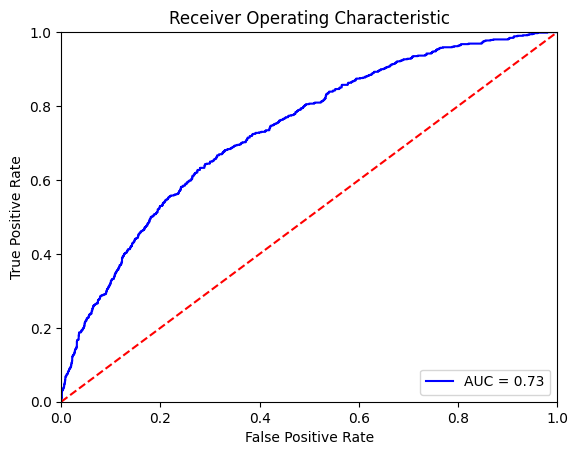

In [635]:
probs = catboost_model.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [637]:
predicciones = catboost_model.predict(X_test)

mat_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = predicciones
                )

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = predicciones,
            normalize = True
           )

print("Matriz de confusión")
print(mat_confusion)
print("")
print(f"El accuracy de test es: {100 * accuracy} %")

print(
    classification_report(
        y_true = y_test,
        y_pred = predicciones
    )
)


Matriz de confusión
[[2269  181]
 [ 515  193]]

El accuracy de test es: 77.9607346421786 %
              precision    recall  f1-score   support

           0       0.82      0.93      0.87      2450
           1       0.52      0.27      0.36       708

    accuracy                           0.78      3158
   macro avg       0.67      0.60      0.61      3158
weighted avg       0.75      0.78      0.75      3158



In [638]:

param_grid = {
    'iterations': [100, 200, 300, 500, 1000],
    'depth': [4, 6, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1, 0.15],
    'l2_leaf_reg': [1, 3, 5, 10],  
    'border_count': [32, 64, 128]
}

In [639]:
cat_random = RandomizedSearchCV(estimator = catboost_model, 
                                   param_distributions = param_grid, 
                                   n_iter = 50, 
                                   cv = 5, 
                                   scoring='roc_auc',
                                   verbose=1, 
                                   random_state=42, 
                                   n_jobs = 1)

In [640]:
cat_random.fit(X_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
0:	learn: 0.6878788	total: 5.88ms	remaining: 1.76s
200:	learn: 0.4177784	total: 392ms	remaining: 193ms
299:	learn: 0.3907976	total: 608ms	remaining: 0us
0:	learn: 0.6878232	total: 2.53ms	remaining: 757ms
200:	learn: 0.4175309	total: 323ms	remaining: 159ms
299:	learn: 0.3909673	total: 481ms	remaining: 0us
0:	learn: 0.6882624	total: 3.67ms	remaining: 1.1s
200:	learn: 0.4199175	total: 324ms	remaining: 159ms
299:	learn: 0.3930989	total: 481ms	remaining: 0us
0:	learn: 0.6879833	total: 2.01ms	remaining: 601ms
200:	learn: 0.4183617	total: 319ms	remaining: 157ms
299:	learn: 0.3915396	total: 477ms	remaining: 0us
0:	learn: 0.6881619	total: 1.59ms	remaining: 476ms
200:	learn: 0.4176707	total: 317ms	remaining: 156ms
299:	learn: 0.3898917	total: 476ms	remaining: 0us
0:	learn: 0.6710722	total: 1.15ms	remaining: 1.15s
200:	learn: 0.3751109	total: 216ms	remaining: 860ms
400:	learn: 0.3072495	total: 432ms	remaining: 645ms
600:	learn: 0.25876

RandomizedSearchCV(cv=5,
                   estimator=<catboost.core.CatBoostClassifier object at 0x33806e030>,
                   n_iter=50, n_jobs=1,
                   param_distributions={'border_count': [32, 64, 128],
                                        'depth': [4, 6, 8, 10],
                                        'iterations': [100, 200, 300, 500,
                                                       1000],
                                        'l2_leaf_reg': [1, 3, 5, 10],
                                        'learning_rate': [0.01, 0.05, 0.1,
                                                          0.15]},
                   random_state=42, scoring='roc_auc', verbose=1)

In [641]:
best_cat = cat_random.best_estimator_

<BarContainer object of 17 artists>

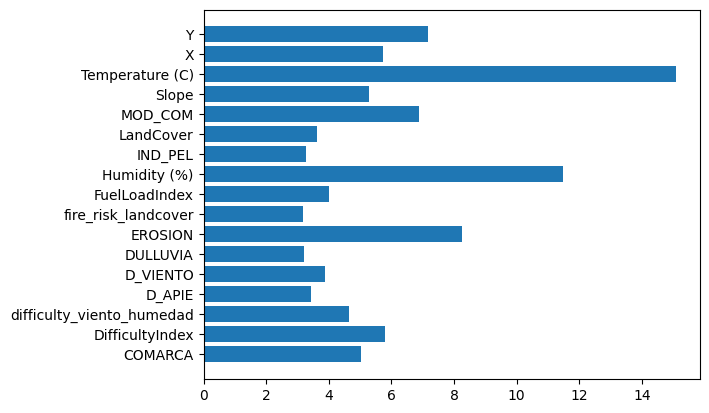

In [642]:
plt.barh(X.columns, best_cat.feature_importances_)

In [643]:
best_cat.fit(X_train,y_train)

0:	learn: 0.6885066	total: 2.71ms	remaining: 2.71s
200:	learn: 0.4489150	total: 275ms	remaining: 1.09s
400:	learn: 0.4201939	total: 514ms	remaining: 768ms
600:	learn: 0.4014380	total: 750ms	remaining: 498ms
800:	learn: 0.3856157	total: 991ms	remaining: 246ms
999:	learn: 0.3693254	total: 1.23s	remaining: 0us


In [644]:
print('BALANCED_ BEST_PARAMS_')

print("Precisión sobre el juego de test: {:.4f}"
      .format(best_cat.score(X_test, y_test)))
print("Precisión sobre el juego de train: {:.4f}"
      .format(best_cat.score(X_train, y_train)))

BALANCED_ BEST_PARAMS_
Precisión sobre el juego de test: 0.7942
Precisión sobre el juego de train: 0.8432


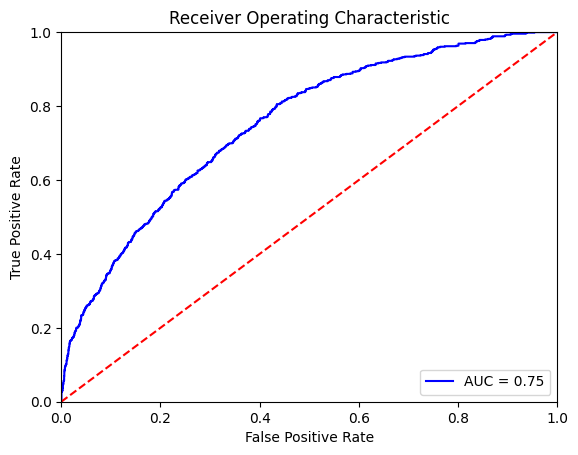

In [645]:
probs = best_cat.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [646]:
predicciones = best_cat.predict(X_test)
mat_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = predicciones
                )

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = predicciones,
            normalize = True
           )

print("Matriz de confusión")
print(mat_confusion)
print("")
print(f"El accuracy de test es: {100 * accuracy} %")

print(
    classification_report(
        y_true = y_test,
        y_pred = predicciones
    )
)


Matriz de confusión
[[2357   93]
 [ 557  151]]

El accuracy de test es: 79.41735275490817 %
              precision    recall  f1-score   support

           0       0.81      0.96      0.88      2450
           1       0.62      0.21      0.32       708

    accuracy                           0.79      3158
   macro avg       0.71      0.59      0.60      3158
weighted avg       0.77      0.79      0.75      3158



In [647]:
#Rango umbrales en pasos pequeños
thresholds = np.arange(0.1, 1.0, 0.1)
precisions = []
recalls = []
f1_scores = []

# Metricas por umbral
for threshold in thresholds:
    y_pred_adjusted = (preds >= threshold).astype(int)  # Aplicar el umbral
    precisions.append(precision_score(y_test, y_pred_adjusted))
    recalls.append(recall_score(y_test, y_pred_adjusted))
    f1_scores.append(f1_score(y_test, y_pred_adjusted))

# resultados
for i, threshold in enumerate(thresholds):
    print(f"Umbral: {threshold:.1f}, Precision: {precisions[i]:.4f}, Recall: {recalls[i]:.4f}, F1-score: {f1_scores[i]:.4f}")


Umbral: 0.1, Precision: 0.2837, Recall: 0.9280, F1-score: 0.4345
Umbral: 0.2, Precision: 0.3624, Recall: 0.7288, F1-score: 0.4841
Umbral: 0.3, Precision: 0.4426, Recall: 0.4845, F1-score: 0.4626
Umbral: 0.4, Precision: 0.5266, Recall: 0.3220, F1-score: 0.3996
Umbral: 0.5, Precision: 0.6189, Recall: 0.2133, F1-score: 0.3172
Umbral: 0.6, Precision: 0.7398, Recall: 0.1285, F1-score: 0.2190
Umbral: 0.7, Precision: 0.7627, Recall: 0.0636, F1-score: 0.1173
Umbral: 0.8, Precision: 0.9474, Recall: 0.0254, F1-score: 0.0495
Umbral: 0.9, Precision: 1.0000, Recall: 0.0014, F1-score: 0.0028


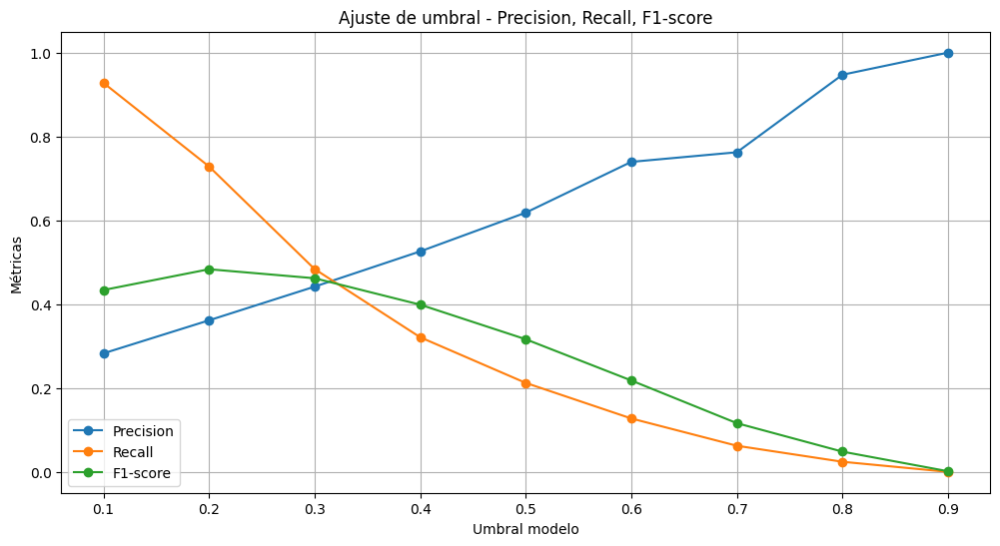

In [648]:
plt.figure(figsize=(12, 6))
plt.plot(thresholds, precisions, label='Precision', marker='o')
plt.plot(thresholds, recalls, label='Recall', marker='o')
plt.plot(thresholds, f1_scores, label='F1-score', marker='o')
plt.xlabel('Umbral modelo')
plt.ylabel('Métricas')
plt.title('Ajuste de umbral - Precision, Recall, F1-score')
plt.legend()
plt.grid(True)
plt.show()


In [649]:
# Coste de un falso positivo (enviar un avión innecesariamente)
cost_fp = 855.55*3  # Coste de enviar un avión segun los datos que tenemos en la introducción de coste hora.
# pongo un *2 porque en la comunidad valenciana tienen 3 y suponemos que mandamos todas las unidades

# Estimación del coste de un falso negativo (no enviar un avión cuando es necesario)
cost_fn = (6343*0.07) # Un valor extraido de las hectarias mediana (medias muy altas) quemadas en los datos obtenidos 
#y el coste medio de perdida medio ambiental segúnhttps://evenor-tech.com/el-coste-economico-de-los-incendios-forestales/

thresholds = np.arange(0.1, 1.0, 0.1)
total_costs = []

for threshold in thresholds:
    # Aplicar el umbral para hacer las predicciones ajustadas
    y_pred_adjusted = (preds >= threshold).astype(int)
    
    # Calculoo FP y FN
    false_positive = ((y_pred_adjusted == 1) & (y_test == 0)).sum()
    false_negative = ((y_pred_adjusted == 0) & (y_test == 1)).sum()

    # Coste total
    total_cost = (false_positive * cost_fp) + (false_negative * cost_fn)
    total_costs.append(total_cost)


for i, threshold in enumerate(thresholds):
    print(f"Umbral: {threshold:.1f}, Coste total: {total_costs[i]:.2f} €")

Umbral: 0.1, Coste total: 4280716.86 €
Umbral: 0.2, Coste total: 2415768.12 €
Umbral: 0.3, Coste total: 1270856.45 €
Umbral: 0.4, Coste total: 739288.05 €
Umbral: 0.5, Coste total: 486012.02 €
Umbral: 0.6, Coste total: 356086.97 €
Umbral: 0.7, Coste total: 330311.73 €
Umbral: 0.8, Coste total: 308933.55 €
Umbral: 0.9, Coste total: 313915.07 €


In [659]:
# Ajuste umbral
threshold = 0.33
y_pred_adjusted = (preds  >= threshold).astype(int)

In [660]:
accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = y_pred_adjusted,
            normalize = True
           )

print(confusion_matrix(y_test, y_pred_adjusted))
print(f"El accuracy de test es: {100 * accuracy} %")
print(classification_report(y_test, y_pred_adjusted))

[[2117  333]
 [ 402  306]]
El accuracy de test es: 76.72577580747308 %
              precision    recall  f1-score   support

           0       0.84      0.86      0.85      2450
           1       0.48      0.43      0.45       708

    accuracy                           0.77      3158
   macro avg       0.66      0.65      0.65      3158
weighted avg       0.76      0.77      0.76      3158



In [661]:
filename = '../Modelos/Avion_terrestre/best_cat_ATerrestre.pkl'

In [662]:
model_and_threshold = {
    'model': best_cat,
    'threshold': threshold}

    
joblib.dump(model_and_threshold, filename)

['../Modelos/Avion_terrestre/best_cat_ATerrestre.pkl']

### Ejemplo uso practico



In [ ]:

def avionANFI(data):
    """
    Función para predecir si se debe enviar un avión basado en las características dadas.

    Args:
        data (dict): dar un diccionario con las siguientes claves:
            ['Slope', 'TEMPMAX', 'V_VIENTO', 'H_RELAT', 'DifficultyIndex',
            'Elevation', 'TOT_EST', 'ENP_1', 'EIMP_GLOB', 'SHAPE_AREA',
            'BOMBEROS', 'GUARCIVIL', 'F_EJERCIT', 'OPERCIV', 'VOLUN_ORG', 'TECNICOS']

   
    """
    # Asegurarse de que los datos están en el orden correcto
    features = ['Slope', 'TEMPMAX', 'V_VIENTO', 'H_RELAT', 'DifficultyIndex',
                'Elevation', 'TOT_EST', 'ENP_1', 'EIMP_GLOB', 'SHAPE_AREA',
                'BOMBEROS', 'GUARCIVIL'] 

    try:
        # ordeanar
        input_data = np.array([data[feature] for feature in features]).reshape(1, -1)

        # P.modelo
        probability = best_model.predict_proba(input_data)[0, 1]  

        # Metemos recomendación un umbral de probabilidad del 80%
        recommendation = "Si, enviar" if probability >= 0.8 else "No, no enviar"

        return {
            "probability": probability,
            "recommendation": recommendation
        }

    except KeyError as e:
        return {"error": f"Falta la característica requerida: {e}"}
    except Exception as e:
        return {"error": f"Ocurrió un error: {e}"}


In [ ]:
# Carga el modelo con joblib
best_model = load('./Modelos/Aviones_descarga/best_light_gbm(2).pkl')

data = {
    'Slope': 11,
    'TEMPMAX': 18,
    'V_VIENTO': 5,
    'H_RELAT': 82,
    'DifficultyIndex': 0,
    'Elevation': 500.0,
    'TOT_EST': 10,
    'ENP_1': 0,
    'EIMP_GLOB': 3,
    'SHAPE_AREA': 214534.97,
    'BOMBEROS': 4,
    'GUARCIVIL': 14
    

}

In [ ]:
result = aviondescarga(data)
print(result)


{'probability': 0.6927540949712792, 'recommendation': 'No, no enviar'}


## Modelos Regresión

una vez que sabemos si necesitamos o no Helicopteros de descarga lo siguiente que tenemos que saber en cada situcion cuantos necesitaríamos


In [ ]:

X = data_filtrado[['COMARCA','DifficultyIndex','D_APIE','D_VIENTO','DULLUVIA',
             'EROSION','ESTACION','Elevation','FuelLoadIndex','Humidity (%)','IND_PEL','LandCover',
             'MOD_COM','Slope','Temperature (C)','V_VIENTO','X','Y','fire_risk_fuel','difficulty_viento_humedad']]
y = data_filtrado[ 'AVIANFNUM']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Random Forest

Va a ser el primer modelo que usamos para poder hacer un aprendizaje supervisado para ello pasaremos de una primera configuracion donde no vamos a ajustar el modelo si no que lo dejamos de fabrica y luego vamos a intentar ajustar los hiperparametros para poder mejorar las metricas de este y que el test y train mejore a la par y no que haya un sobre ajuste que suele producirse 

Pruebo a hacer el random Forest con los datos predeterminados 

In [ ]:
# Modelo de Random Forest Regressor
forest = RandomForestRegressor(random_state=123)


In [ ]:
forest.fit(X_train, y_train)

RandomForestRegressor(random_state=123)

Como no hemos aplicado el cross validation se produce un sobreajuste de los datos por lo tanto a partir de ahora es cuando se juega con lo parametros para conseguir mejores valores

In [ ]:

# Evaluar el modelo inicial
y_pred = forest.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"MSE del modelo inicial: {mse}")
print(f"MAE del modelo inicial: {mae}")
print(f"R2 del modelo inicial: {r2}")



MSE del modelo inicial: 0.3864634039324261
MAE del modelo inicial: 0.20355821236376792
R2 del modelo inicial: 0.41545507684649496


In [ ]:
# Hiperparametros
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [ None, 10, 2, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [5, 7, 9]
}



In [ ]:
combinaciones = ParameterGrid(param_grid)

In [ ]:
# Diccionario para almacenar los resultados
resultados = {'params': [], 'mse': [], 'mae': [], 'r2': []}

# Entreno del modelo por parametros

for params in combinaciones:
    modelo = RandomForestRegressor(
        random_state=123,
        **params
    )

    # Entrenar el modelo
    modelo.fit(X_train, y_train)
    y_pred = modelo.predict(X_test)

    # Calcular métricas
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Guardar los resultados
    resultados['params'].append(params)
    resultados['mse'].append(mse)
    resultados['mae'].append(mae)
    resultados['r2'].append(r2)

In [ ]:

resultados_df = pd.DataFrame(resultados)
resultados_df = pd.concat([resultados_df, resultados_df['params'].apply(pd.Series)], axis=1)
resultados_df = resultados_df.drop(columns='params')
resultados_df = resultados_df.sort_values('mse', ascending=True)  # Ordenar por menor MSE

resultados_df.head()


,mse,mae,r2,max_depth,max_features,min_samples_leaf,min_samples_split,n_estimators
109,0.367175,0.194410,0.444630,10.0,7.0,1.0,2.0,100.0
110,0.367960,0.194801,0.443442,10.0,7.0,1.0,2.0,200.0
135,0.369953,0.193868,0.440428,10.0,9.0,1.0,2.0,50.0
2,0.370973,0.202390,0.438885,NaN,5.0,1.0,2.0,200.0
245,0.371338,0.202359,0.438333,30.0,5.0,1.0,2.0,200.0


In [ ]:

# mejor modelo
mejores_params = resultados_df.iloc[0].drop(['mse', 'mae', 'r2']).to_dict()
for key, value in mejores_params.items():
    if isinstance(value, float) and value.is_integer():
        mejores_params[key] = int(value)
        
modelo_final = RandomForestRegressor(random_state=123, **mejores_params)
modelo_final.fit(X_train, y_train)



RandomForestRegressor(max_depth=10, max_features=7, random_state=123)

In [ ]:
# modelo final
y_pred_final = modelo_final.predict(X_test)
mse_final = mean_squared_error(y_test, y_pred_final)
mae_final = mean_absolute_error(y_test, y_pred_final)
r2_final = r2_score(y_test, y_pred_final)


print(f"MSE del modelo final: {mse_final}")
print(f"MAE del modelo final: {mae_final}")
print(f"R2 del modelo final: {r2_final}")

MSE del modelo final: 0.3671750718367893
MAE del modelo final: 0.19441011356047014
R2 del modelo final: 0.4446296286614314


Ahora voy a intentar mejorar el modelo con los hiperparametros antes de empezar a a usar nueva variables

Importancia de las características en el modelo Random Forest:
                           Importancia
COMARCA                       0.033576
DifficultyIndex               0.040378
D_APIE                        0.046836
D_VIENTO                      0.026138
DULLUVIA                      0.040519
EROSION                       0.052142
ESTACION                      0.040034
Elevation                     0.068953
FuelLoadIndex                 0.014117
Humidity (%)                  0.129016
IND_PEL                       0.021900
LandCover                     0.012183
MOD_COM                       0.081344
Slope                         0.052507
Temperature (C)               0.086344
V_VIENTO                      0.031750
X                             0.053096
Y                             0.064202
fire_risk_fuel                0.063455
difficulty_viento_humedad     0.041509


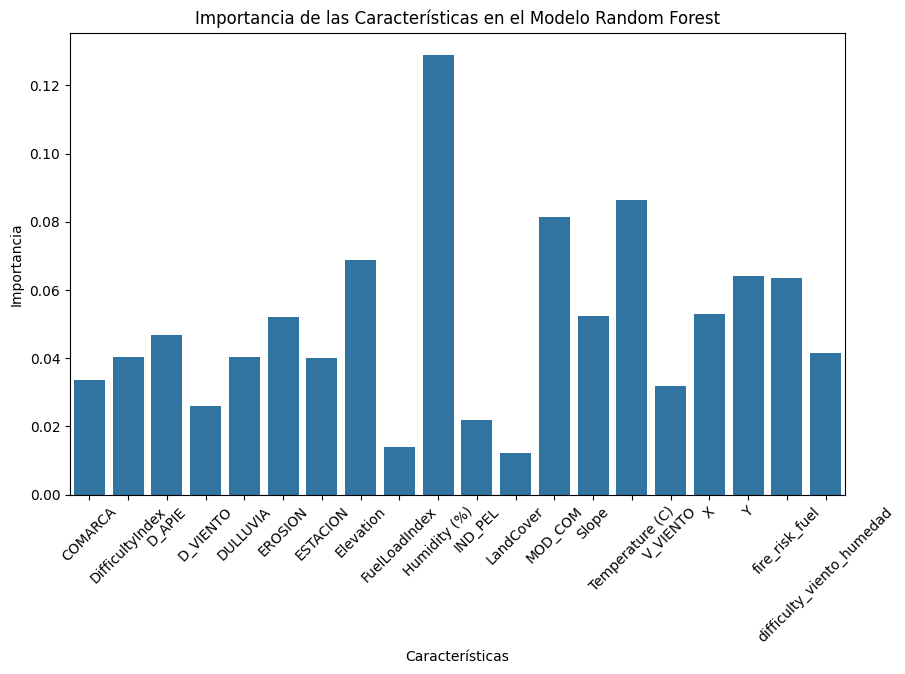

In [ ]:

# Importancia de las características en el modelo Random Forest
feature_importances = forest.feature_importances_
feature_importance_df = pd.DataFrame(feature_importances, index=X.columns, columns=['Importancia'])
print('Importancia de las características en el modelo Random Forest:')
print(feature_importance_df)

# Graficar la importancia de las características en el modelo Random Forest
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importance_df.index, y=feature_importance_df['Importancia'])
plt.title('Importancia de las Características en el Modelo Random Forest')
plt.xlabel('Características')
plt.ylabel('Importancia')
plt.xticks(rotation = 45)
plt.show()


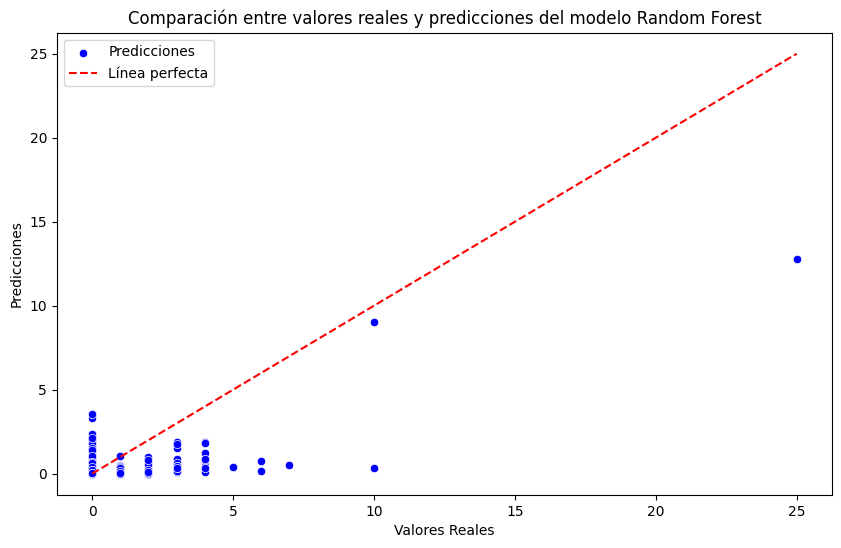

In [ ]:
# Crear un DataFrame con las predicciones y los valores reales
predictions_df = pd.DataFrame({'Real': y_test, 'Predicción': y_pred_final})

# Graficar la comparación entre los valores reales y las predicciones
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Real', y='Predicción', data=predictions_df, color='blue', label='Predicciones')
plt.plot([predictions_df['Real'].min(), predictions_df['Real'].max()],
         [predictions_df['Real'].min(), predictions_df['Real'].max()],
         color='red', linestyle='--', label='Línea perfecta')

# Etiquetas y título
plt.title('Comparación entre valores reales y predicciones del modelo Random Forest')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.legend()

# Mostrar gráfico
plt.show()
